## Siemens PCA and FPCA as outlier detector

This code shows the implementation FPCA for reducing the dimension of the multiple time series after removing bad error codes.
It adds the scores and identify the time series which contribute the most to the principal components. 

**Index**

1. Loading the datasets
2. Transposing the time series datasets
3. Merging time series datasets to add additional features
4. Identifying TestID with bad return codes
5. Data cleaning - Removing unsuccessful return codes
6. Filtering and spliting in Blood and Aquous groups
7. Window extraction
8. Removing partial or full series with missing values after the window extraction
9. Function to plot time series in one plot
10. Visualization of Time Series from the Windows
11. Functional PCA (Visualization of Principal Component Plots in one row)
    - 11.1. Functional PCA characterization function
        - 11.1.1. Functional PC1 and Characterization of FPC Scores
     

The improvements with respect to the code "Siemens_PCA_FPCA.ipybn" are:

In 11) The functional principal componet plots are display in one row **(WE CAN ADJUST Y_AXIS LIMITS OR PLOT THE DEFAULT ONES, HOWEVER, THE RANGE CAN BE DECEIVING)**.
Additionally, we add the plots of the first principal component for both systems together and characterize the PC scores by mapping with colors the additional attributes.

## 1. Loading the datasets

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import altair as alt
import random
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from skfda.representation.grid import FDataGrid
from skfda.preprocessing.dim_reduction.projection import FPCA

/var/folders/_c/wdm33bq11dvflh73ffxrd8z40000gn/T/ipykernel_2791/212172022.py:10: DeprecationWarning: The module "projection" is deprecated. Please use "dim_reduction"
  from skfda.preprocessing.dim_reduction.projection import FPCA


## 2. Transposing the time series datasets 

In [2]:
# Import datasets
sensorA_System1 = pd.read_csv("RawData/System1_SensorA.csv")
sensorA_System2 = pd.read_csv("RawData/System2_SensorA.csv")
sensorB_System1 = pd.read_csv("RawData/System1_SensorB.csv")
sensorB_System2 = pd.read_csv("RawData/System2_SensorB.csv")
keyByTestID = pd.read_csv("RawData/Key by TestID.csv", parse_dates=['DateTime'])

## 3. Merging time series datasets to add additional features

In [3]:
# Transpose dataset to make columns as timestamps and rows as tests

# Sensor A
A1_transposed = sensorA_System1.T.reset_index()
A1_transposed.columns = A1_transposed.iloc[0]
A1_transposed.rename(columns={A1_transposed.columns[0]: 'TestID'}, inplace=True)
A1_transposed = A1_transposed.drop(0)
A1_transposed['TestID'] = A1_transposed['TestID'].astype(int)

A2_transposed = sensorA_System2.T.reset_index()
A2_transposed.columns = A2_transposed.iloc[0]
A2_transposed.rename(columns={A2_transposed.columns[0]: 'TestID'}, inplace=True)
A2_transposed = A2_transposed.drop(0)
A2_transposed['TestID'] = A2_transposed['TestID'].astype(int)

# Sensor B
B1_transposed = sensorB_System1.T.reset_index()
B1_transposed.columns = B1_transposed.iloc[0]
B1_transposed.rename(columns={B1_transposed.columns[0]: 'TestID'}, inplace=True)
B1_transposed = B1_transposed.drop(0)
B1_transposed['TestID'] = B1_transposed['TestID'].astype(int)

B2_transposed = sensorB_System2.T.reset_index()
B2_transposed.columns = B2_transposed.iloc[0]
B2_transposed.rename(columns={B2_transposed.columns[0]: 'TestID'}, inplace=True)
B2_transposed = B2_transposed.drop(0)
B2_transposed['TestID'] = B2_transposed['TestID'].astype(int)

In [4]:
# Merge dataset with keyByTestID and delete unmatched tests
# Sensor A
keyByTestID['TestID'] = keyByTestID['TestID'].astype(int)
keyByTestID['System'] = keyByTestID['System'].astype(str)

A1_keyByTestID = keyByTestID[(keyByTestID['Sensor'] == 'Sensor A') & (keyByTestID['System'] == 'System 1')]
A1_Merged = pd.merge(A1_keyByTestID,A1_transposed,how='inner', on=['TestID'])
A1_transposed = A1_transposed[A1_transposed['TestID'].isin(A1_Merged['TestID'])]

A2_keyByTestID = keyByTestID.loc[(keyByTestID['Sensor'] == 'Sensor A') & (keyByTestID['System'] != 'System 1')]
A2_Merged = pd.merge(A2_keyByTestID,A2_transposed,how='inner', on=['TestID'])
A2_transposed = A2_transposed[A2_transposed['TestID'].isin(A2_Merged['TestID'])]

sensorA_System1 = sensorA_System1.loc[:, sensorA_System1.columns.isin(A1_Merged['TestID'].astype(str))]
sensorA_System2 = sensorA_System2.loc[:, sensorA_System2.columns.isin(A2_Merged['TestID'].astype(str))]

# Merge dataset with keyByTestID
# Sensor B
B1_keyByTestID = keyByTestID[(keyByTestID['Sensor'] == 'Sensor B') & (keyByTestID['System'] == 'System 1')]
B1_Merged = pd.merge(B1_keyByTestID,B1_transposed,how='inner', on=['TestID'])
B1_transposed = B1_transposed[B1_transposed['TestID'].isin(B1_Merged['TestID'])]

B2_keyByTestID = keyByTestID.loc[(keyByTestID['Sensor'] == 'Sensor B') & (keyByTestID['System'] != 'System 1')]
B2_Merged = pd.merge(B2_keyByTestID,B2_transposed,how='inner', on=['TestID'])
B2_transposed = B2_transposed[B2_transposed['TestID'].isin(B2_Merged['TestID'])]

sensorB_System1 = sensorB_System1.loc[:, sensorB_System1.columns.isin(B1_Merged['TestID'].astype(str))]
sensorB_System2 = sensorB_System2.loc[:, sensorB_System2.columns.isin(B2_Merged['TestID'].astype(str))]

print('A1: ', A1_Merged.shape)
print('A2: ', A2_Merged.shape)
print('B1: ', B1_Merged.shape)
print('B2: ', B2_Merged.shape)

A1:  (3407, 2694)
A2:  (7781, 1319)
B1:  (3398, 3376)
B2:  (7780, 3367)


## 4. Identifying TestID with bad return codes

In [5]:
A1_Merged_bad_returncodes = A1_Merged[~A1_Merged['ReturnCode'].isin(['Success', 'UnderReportableRange'])].copy()
A2_Merged_bad_returncodes = A2_Merged[~A2_Merged['ReturnCode'].isin(['Success', 'UnderReportableRange'])].copy()
B1_Merged_bad_returncodes = B1_Merged[~B1_Merged['ReturnCode'].isin(['Success', 'UnderReportableRange'])].copy()
B2_Merged_bad_returncodes = B2_Merged[~B2_Merged['ReturnCode'].isin(['Success', 'UnderReportableRange'])].copy()

print('A1_Merged_bad_returncodes\n')
print('Total: ', A1_Merged_bad_returncodes['TestID'].shape[0])
print(A1_Merged_bad_returncodes['TestID'])
print('\nA2_Merged_bad_returncodes\n')
print('Total: ', A2_Merged_bad_returncodes['TestID'].shape[0])
print(A2_Merged_bad_returncodes['TestID'])
print('\nB1_Merged_bad_returncodes\n')
print('Total: ', B1_Merged_bad_returncodes['TestID'].shape[0])
print(B1_Merged_bad_returncodes['TestID'])
print('\nB2_Merged_bad_returncodes\n')
print('Total: ', B2_Merged_bad_returncodes['TestID'].shape[0])
print(B2_Merged_bad_returncodes['TestID'])

A1_Merged_bad_returncodes

Total:  25
0       12414199
44      12416289
48      12416278
122     12446029
201     12486850
492     12601278
728     12191442
995     12514810
1051    12515535
1091    12515705
1205    12480292
1207    12623120
1242    12597803
1355    12530207
1602    12530199
1915    12472338
2060    12530446
2071    12530379
2261    12557613
2301    12470796
2352    12529229
2374    12390613
2652    12371902
2826    12529328
3095    12531249
Name: TestID, dtype: int64

A2_Merged_bad_returncodes

Total:  38
608     3561473
859     3545381
1085    3547411
1258    3548457
1698    3553569
1728    3553619
1983    3555557
2258    3557972
2497    3561799
2688    3564315
2877    3565626
2889    3565643
2924    3565699
2944    3565740
3009    3565982
3039    3566065
3046    3566584
3072    3566624
3115    3566834
3117    3566837
3118    3566838
3171    3566963
3806    3552740
3921    3552653
4039    3569098
5523    3555888
5577    3555913
5608    3558047
6242    3558380
6950   

## 5. Data cleaning - Removing unsuccessful return codes

In [6]:
A1_Merged = A1_Merged[A1_Merged['ReturnCode'].isin(['Success', 'UnderReportableRange'])].copy()
A2_Merged = A2_Merged[A2_Merged['ReturnCode'].isin(['Success', 'UnderReportableRange'])].copy()
B1_Merged = B1_Merged[B1_Merged['ReturnCode'].isin(['Success', 'UnderReportableRange'])].copy()
B2_Merged = B2_Merged[B2_Merged['ReturnCode'].isin(['Success', 'UnderReportableRange'])].copy()

A1_Merged.reset_index(drop=True, inplace=True)
A2_Merged.reset_index(drop=True, inplace=True)
B1_Merged.reset_index(drop=True, inplace=True)
B2_Merged.reset_index(drop=True, inplace=True)

print('A1: ', A1_Merged.shape)
print('A2: ', A2_Merged.shape)
print('B1: ', B1_Merged.shape)
print('B2: ', B2_Merged.shape)

A1:  (3382, 2694)
A2:  (7743, 1319)
B1:  (3375, 3376)
B2:  (7745, 3367)


## 6. Filtering and spliting in Blood and Aquous groups

In [7]:
# Blood
A1_blood_Merged = A1_Merged[A1_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])].copy()
A2_blood_Merged = A2_Merged[A2_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])].copy()
A1_blood_Merged.reset_index(drop=True, inplace=True)
A2_blood_Merged.reset_index(drop=True, inplace=True)

# Aquous
A1_aquous_Merged = A1_Merged[~A1_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])].copy()
A2_aquous_Merged = A2_Merged[~A2_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])].copy()
A1_aquous_Merged.reset_index(drop=True, inplace=True)
A2_aquous_Merged.reset_index(drop=True, inplace=True)

# Blood
B1_blood_Merged = (B1_Merged[B1_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])]).copy()
B2_blood_Merged = (B2_Merged[B2_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])]).copy()
B1_blood_Merged.reset_index(drop=True, inplace=True)
B2_blood_Merged.reset_index(drop=True, inplace=True)

# Aquous
B1_aquous_Merged = (B1_Merged[~B1_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])]).copy()
B2_aquous_Merged = (B2_Merged[~B2_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])]).copy()
B1_aquous_Merged.reset_index(drop=True, inplace=True)
B2_aquous_Merged.reset_index(drop=True, inplace=True)

## 7. Window extraction

In [8]:
# Match window values of Sensor A for each test
calDelimit = 11
cal_window_size = 8
sampleDelimit = 15
sample_window_size = 5

# Match window values of Sensor B for each test

# Blood
calDelLimit_sensorB_blood = 20
sampleDelLimit_sensorB_blood = 24
calWindowSize_sensorB_blood = 18
sampleWindowSize_sensorB_blood = 4

# Aquous
calDelLimit_sensorB_aqueous = 20
sampleDelLimit_sensorB_aqueous = 30
calWindowSize_sensorB_aqueous = 18
sampleWindowSize_sensorB_aqueous = 4

# Define a function to calculate window start and end values
def calculate_window_values(bubble_start, sample_start, calDelimit_input, cal_window_size_input, sampleDelimit_input, sample_window_size_input):
    cal_window_start = bubble_start - calDelimit_input
    cal_window_end = cal_window_start + cal_window_size_input
    sample_window_start = sample_start + sampleDelimit_input
    sample_window_end = sample_window_start + sample_window_size_input
    return round(cal_window_start,1), round(cal_window_end,1), round(sample_window_start,1), round(sample_window_end,1)

# Sensor A
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A1_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A1_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A1_Merged['cal_window_start']=cal_window_start
A1_Merged['cal_window_end']=cal_window_end
A1_Merged['sample_window_start']=sample_window_start
A1_Merged['sample_window_end']=sample_window_end

cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A2_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A2_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A2_Merged['cal_window_start']=cal_window_start
A2_Merged['cal_window_end']=cal_window_end
A2_Merged['sample_window_start']=sample_window_start
A2_Merged['sample_window_end']=sample_window_end


# Sensor A - Blood
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A1_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A1_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A1_blood_Merged['cal_window_start']=cal_window_start
A1_blood_Merged['cal_window_end']=cal_window_end
A1_blood_Merged['sample_window_start']=sample_window_start
A1_blood_Merged['sample_window_end']=sample_window_end


cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A2_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A2_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A2_blood_Merged['cal_window_start']=cal_window_start
A2_blood_Merged['cal_window_end']=cal_window_end
A2_blood_Merged['sample_window_start']=sample_window_start
A2_blood_Merged['sample_window_end']=sample_window_end


# Sensor A - Aquous
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A1_aquous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A1_aquous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A1_aquous_Merged['cal_window_start']=cal_window_start
A1_aquous_Merged['cal_window_end']=cal_window_end
A1_aquous_Merged['sample_window_start']=sample_window_start
A1_aquous_Merged['sample_window_end']=sample_window_end


cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A2_aquous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A2_aquous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A2_aquous_Merged['cal_window_start']=cal_window_start
A2_aquous_Merged['cal_window_end']=cal_window_end
A2_aquous_Merged['sample_window_start']=sample_window_start
A2_aquous_Merged['sample_window_end']=sample_window_end

# Sensor B - Blood
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B1_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B1_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_blood,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_blood,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_blood,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_blood)
B1_blood_Merged['cal_window_start']=cal_window_start
B1_blood_Merged['cal_window_end']=cal_window_end
B1_blood_Merged['sample_window_start']=sample_window_start
B1_blood_Merged['sample_window_end']=sample_window_end

cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B2_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B2_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_blood,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_blood,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_blood,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_blood)
B2_blood_Merged['cal_window_start']=cal_window_start
B2_blood_Merged['cal_window_end']=cal_window_end
B2_blood_Merged['sample_window_start']=sample_window_start
B2_blood_Merged['sample_window_end']=sample_window_end


# Sensor B - Aquous
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B1_aquous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B1_aquous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_aqueous,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_aqueous,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_aqueous,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_aqueous)
B1_aquous_Merged['cal_window_start']=cal_window_start
B1_aquous_Merged['cal_window_end']=cal_window_end
B1_aquous_Merged['sample_window_start']=sample_window_start
B1_aquous_Merged['sample_window_end']=sample_window_end


cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B2_aquous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B2_aquous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_aqueous,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_aqueous,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_aqueous,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_aqueous)
B2_aquous_Merged['cal_window_start']=cal_window_start
B2_aquous_Merged['cal_window_end']=cal_window_end
B2_aquous_Merged['sample_window_start']=sample_window_start
B2_aquous_Merged['sample_window_end']=sample_window_end

In [9]:
# Define a function to extract window data of each test
def calculate_window_data(row):
    cal_start_time = row['cal_window_start']
    cal_end_time = row['cal_window_end']
    sample_start_time = row['sample_window_start']
    sample_end_time = row['sample_window_end']
    timestamps = row.index[18:-4].values.astype(float)
    cal_window = timestamps[(timestamps >= cal_start_time) & (timestamps <= cal_end_time)]
    sample_window = timestamps[(timestamps >= sample_start_time) & (timestamps <= sample_end_time)]
    return row[cal_window],row[sample_window]

# Sensor A

A1_cal_window = []
A1_sample_window = []
for i in range(len(A1_Merged)):
    cal_window, sample_window = calculate_window_data(A1_Merged.iloc[i, :])
    A1_cal_window.append(cal_window.values)
    A1_sample_window.append(sample_window.values)
A1_cal_window = pd.DataFrame(A1_cal_window)
A1_sample_window = pd.DataFrame(A1_sample_window)
A1_cal_window['TestID'] = A1_sample_window['TestID'] = A1_Merged['TestID']
A1_sample_window.set_index('TestID',inplace=True)
A1_cal_window.set_index('TestID',inplace=True)

A2_cal_window = []
A2_sample_window = []
for i in range(len(A2_Merged)):
    cal_window, sample_window = calculate_window_data(A2_Merged.iloc[i, :])
    A2_cal_window.append(cal_window.values)
    A2_sample_window.append(sample_window.values)
A2_cal_window = pd.DataFrame(A2_cal_window)
A2_sample_window = pd.DataFrame(A2_sample_window)
A2_cal_window['TestID'] = A2_sample_window['TestID'] = A2_Merged['TestID']
A2_sample_window.set_index('TestID',inplace=True)
A2_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor A - Blood

A1_blood_cal_window = []
A1_blood_sample_window = []
for i in range(len(A1_blood_Merged)):
    cal_window, sample_window = calculate_window_data(A1_blood_Merged.iloc[i, :])
    A1_blood_cal_window.append(cal_window.values)
    A1_blood_sample_window.append(sample_window.values)
A1_blood_cal_window = pd.DataFrame(A1_blood_cal_window)
A1_blood_sample_window = pd.DataFrame(A1_blood_sample_window)
A1_blood_cal_window['TestID'] = A1_blood_sample_window['TestID'] = A1_blood_Merged['TestID']
A1_blood_sample_window.set_index('TestID',inplace=True)
A1_blood_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor A - Aquous

A1_aquous_cal_window = []
A1_aquous_sample_window = []
for i in range(len(A1_aquous_Merged)):
    cal_window, sample_window = calculate_window_data(A1_aquous_Merged.iloc[i, :])
    A1_aquous_cal_window.append(cal_window.values)
    A1_aquous_sample_window.append(sample_window.values)
A1_aquous_cal_window = pd.DataFrame(A1_aquous_cal_window)
A1_aquous_sample_window = pd.DataFrame(A1_aquous_sample_window)
A1_aquous_cal_window['TestID'] = A1_aquous_sample_window['TestID'] = A1_aquous_Merged['TestID']
A1_aquous_sample_window.set_index('TestID',inplace=True)
A1_aquous_cal_window.set_index('TestID',inplace=True)

# System 2 - Sensor A - Blood

A2_blood_cal_window = []
A2_blood_sample_window = []
for i in range(len(A2_blood_Merged)):
    cal_window, sample_window = calculate_window_data(A2_blood_Merged.iloc[i, :])
    A2_blood_cal_window.append(cal_window.values)
    A2_blood_sample_window.append(sample_window.values)
A2_blood_cal_window = pd.DataFrame(A2_blood_cal_window)
A2_blood_sample_window = pd.DataFrame(A2_blood_sample_window)
A2_blood_cal_window['TestID'] = A2_blood_sample_window['TestID'] = A2_blood_Merged['TestID']
A2_blood_sample_window.set_index('TestID',inplace=True)
A2_blood_cal_window.set_index('TestID',inplace=True)

# System 2 - Sensor A - Aquous

A2_aquous_cal_window = []
A2_aquous_sample_window = []
for i in range(len(A2_aquous_Merged)):
    cal_window, sample_window = calculate_window_data(A2_aquous_Merged.iloc[i, :])
    A2_aquous_cal_window.append(cal_window.values)
    A2_aquous_sample_window.append(sample_window.values)
A2_aquous_cal_window = pd.DataFrame(A2_aquous_cal_window)
A2_aquous_sample_window = pd.DataFrame(A2_aquous_sample_window)
A2_aquous_cal_window['TestID'] = A2_aquous_sample_window['TestID'] = A2_aquous_Merged['TestID']
A2_aquous_sample_window.set_index('TestID',inplace=True)
A2_aquous_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor B - Blood

B1_blood_cal_window = []
B1_blood_sample_window = []
for i in range(len(B1_blood_Merged)):
    cal_window, sample_window = calculate_window_data(B1_blood_Merged.iloc[i, :])
    B1_blood_cal_window.append(cal_window.values)
    B1_blood_sample_window.append(sample_window.values)
B1_blood_cal_window = pd.DataFrame(B1_blood_cal_window)
B1_blood_sample_window = pd.DataFrame(B1_blood_sample_window)
B1_blood_cal_window['TestID'] = B1_blood_sample_window['TestID'] = B1_blood_Merged['TestID']
B1_blood_sample_window.set_index('TestID',inplace=True)
B1_blood_cal_window.set_index('TestID',inplace=True)

# System 2 - Sensor B - Blood

B2_blood_cal_window = []
B2_blood_sample_window = []
for i in range(len(B2_blood_Merged)):
    cal_window, sample_window = calculate_window_data(B2_blood_Merged.iloc[i, :])
    B2_blood_cal_window.append(cal_window.values)
    B2_blood_sample_window.append(sample_window.values)
B2_blood_cal_window = pd.DataFrame(B2_blood_cal_window)
B2_blood_sample_window = pd.DataFrame(B2_blood_sample_window)
B2_blood_cal_window['TestID'] = B2_blood_sample_window['TestID'] = B2_blood_Merged['TestID']
B2_blood_sample_window.set_index('TestID',inplace=True)
B2_blood_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor B - Aquous

B1_aquous_cal_window = []
B1_aquous_sample_window = []
for i in range(len(B1_aquous_Merged)):
    cal_window, sample_window = calculate_window_data(B1_aquous_Merged.iloc[i, :])
    B1_aquous_cal_window.append(cal_window.values)
    B1_aquous_sample_window.append(sample_window.values)
B1_aquous_cal_window = pd.DataFrame(B1_aquous_cal_window)
B1_aquous_sample_window = pd.DataFrame(B1_aquous_sample_window)
B1_aquous_cal_window['TestID'] = B1_aquous_sample_window['TestID'] = B1_aquous_Merged['TestID']
B1_aquous_sample_window.set_index('TestID',inplace=True)
B1_aquous_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor B - Aquous

B2_aquous_cal_window = []
B2_aquous_sample_window = []
for i in range(len(B2_aquous_Merged)):
    cal_window, sample_window = calculate_window_data(B2_aquous_Merged.iloc[i, :])
    B2_aquous_cal_window.append(cal_window.values)
    B2_aquous_sample_window.append(sample_window.values)
B2_aquous_cal_window = pd.DataFrame(B2_aquous_cal_window)
B2_aquous_sample_window = pd.DataFrame(B2_aquous_sample_window)
B2_aquous_cal_window['TestID'] = B2_aquous_sample_window['TestID'] = B2_aquous_Merged['TestID']
B2_aquous_sample_window.set_index('TestID',inplace=True)
B2_aquous_cal_window.set_index('TestID',inplace=True)

## 8. Removing partial or full series with missing values after the window extraction

In [10]:
# Keep na index
A1_cal_window_drop_index = A1_cal_window.loc[A1_cal_window.isna().sum(axis=1)!=0].index
A2_cal_window_drop_index = A2_cal_window.loc[A2_cal_window.isna().sum(axis=1)!=0].index

A1_blood_cal_window_drop_index = A1_blood_cal_window.loc[A1_blood_cal_window.isna().sum(axis=1)!=0].index
A1_aquous_cal_window_drop_index = A1_aquous_cal_window.loc[A1_aquous_cal_window.isna().sum(axis=1)!=0].index
A2_blood_cal_window_drop_index = A2_blood_cal_window.loc[A2_blood_cal_window.isna().sum(axis=1)!=0].index
A2_aquous_cal_window_drop_index = A2_aquous_cal_window.loc[A2_aquous_cal_window.isna().sum(axis=1)!=0].index

B1_blood_cal_window_drop_index = B1_blood_cal_window.loc[B1_blood_cal_window.isna().sum(axis=1)!=0].index
B1_aquous_cal_window_drop_index = B1_aquous_cal_window.loc[B1_aquous_cal_window.isna().sum(axis=1)!=0].index
B2_blood_cal_window_drop_index = B2_blood_cal_window.loc[B2_blood_cal_window.isna().sum(axis=1)!=0].index
B2_aquous_cal_window_drop_index = B2_aquous_cal_window.loc[B2_aquous_cal_window.isna().sum(axis=1)!=0].index

A1_sample_window_drop_index = A1_sample_window.loc[A1_sample_window.isna().sum(axis=1)!=0].index
A2_sample_window_drop_index = A2_sample_window.loc[A2_sample_window.isna().sum(axis=1)!=0].index

A1_blood_sample_window_drop_index = A1_blood_sample_window.loc[A1_blood_sample_window.isna().sum(axis=1)!=0].index
A1_aquous_sample_window_drop_index = A1_aquous_sample_window.loc[A1_aquous_sample_window.isna().sum(axis=1)!=0].index
A2_blood_sample_window_drop_index = A2_blood_sample_window.loc[A2_blood_sample_window.isna().sum(axis=1)!=0].index
A2_aquous_sample_window_drop_index = A2_aquous_sample_window.loc[A2_aquous_sample_window.isna().sum(axis=1)!=0].index

B1_blood_sample_window_drop_index = B1_blood_sample_window.loc[B1_blood_sample_window.isna().sum(axis=1)!=0].index
B1_aquous_sample_window_drop_index = B1_aquous_sample_window.loc[B1_aquous_sample_window.isna().sum(axis=1)!=0].index
B2_blood_sample_window_drop_index = B2_blood_sample_window.loc[B2_blood_sample_window.isna().sum(axis=1)!=0].index
B2_aquous_sample_window_drop_index = B2_aquous_sample_window.loc[B2_aquous_sample_window.isna().sum(axis=1)!=0].index

# Check if missing values in different windows is different
print("The missing value in calibration window:",A1_cal_window_drop_index)
print("The missing value in sample window:",A1_sample_window_drop_index)
print("The missing value in calibration window:",A2_cal_window_drop_index)
print("The missing value in sample window:",A2_sample_window_drop_index)

print("The missing value in calibration window:",B1_blood_cal_window_drop_index)
print("The missing value in sample window:",B1_blood_sample_window_drop_index)
print("The missing value in calibration window:",B2_blood_cal_window_drop_index)
print("The missing value in sample window:",B2_blood_sample_window_drop_index)


The missing value in calibration window: Int64Index([12514332, 12514394, 12514395, 12514445, 12514446, 12514520,
            12514521, 12514795, 12514835, 12514836, 12514949, 12514951,
            12515039, 12515041, 12515132, 12515134, 12515493, 12515494,
            12515574, 12515575, 12515649, 12515652, 12515752, 12515753,
            12515855, 12515856, 12516008, 12516030, 12516031, 12516052,
            12516053, 12516066, 12516067],
           dtype='int64', name='TestID')
The missing value in sample window: Int64Index([12514332, 12514394, 12514395, 12514445, 12514446, 12514520,
            12514521, 12514795, 12514835, 12514836, 12514949, 12514951,
            12515039, 12515041, 12515132, 12515134, 12515493, 12515494,
            12515574, 12515575, 12515649, 12515652, 12515752, 12515753,
            12515855, 12515856, 12516008, 12516030, 12516031, 12516052,
            12516053, 12516066, 12516067],
           dtype='int64', name='TestID')
The missing value in calibration wi

In [11]:
# Drop TestId's with NA's from the extracted time series
# Drop TestId's with NA's
A1_cal_window.drop(A1_sample_window_drop_index,inplace=True)
A2_cal_window.drop(A2_sample_window_drop_index,inplace=True)

A1_blood_cal_window.drop(A1_blood_sample_window_drop_index,inplace=True)
A1_aquous_cal_window.drop(A1_aquous_sample_window_drop_index,inplace=True)
A2_blood_cal_window.drop(A2_blood_sample_window_drop_index,inplace=True)
A2_aquous_cal_window.drop(A2_aquous_sample_window_drop_index,inplace=True)

B1_blood_cal_window.drop(B1_blood_sample_window_drop_index,inplace=True)
B1_aquous_cal_window.drop(B1_aquous_sample_window_drop_index,inplace=True)
B2_blood_cal_window.drop(B2_blood_sample_window_drop_index,inplace=True)
B2_aquous_cal_window.drop(B2_aquous_sample_window_drop_index,inplace=True)

A1_sample_window.drop(A1_sample_window_drop_index,inplace=True)
A2_sample_window.drop(A2_sample_window_drop_index,inplace=True)

A1_blood_sample_window.drop(A1_blood_sample_window_drop_index,inplace=True)
A1_aquous_sample_window.drop(A1_aquous_sample_window_drop_index,inplace=True)
A2_blood_sample_window.drop(A2_blood_sample_window_drop_index,inplace=True)
A2_aquous_sample_window.drop(A2_aquous_sample_window_drop_index,inplace=True)

B1_blood_sample_window.drop(B1_blood_sample_window_drop_index,inplace=True)
B1_aquous_sample_window.drop(B1_aquous_sample_window_drop_index,inplace=True)
B2_blood_sample_window.drop(B2_blood_sample_window_drop_index,inplace=True)
B2_aquous_sample_window.drop(B2_aquous_sample_window_drop_index,inplace=True)

print('Shape of the time series after removing NAs')
print('A1_cal: ', A1_cal_window.shape)
print('A2_cal: ',  A2_cal_window.shape)

print('A1_blood_cal_window: ', A1_blood_cal_window.shape)
print('A1_aquous_cal_window: ', A1_aquous_cal_window.shape)
print('A2_blood_cal_window: ', A2_blood_cal_window.shape)
print('A2_aquous_cal_window: ', A2_aquous_cal_window.shape)

print('B1_blood_cal_window: ', B1_blood_cal_window.shape)
print('B1_aquous_cal_window: ', B1_aquous_cal_window.shape)
print('B2_blood_cal_window: ', B2_blood_cal_window.shape)
print('B2_aquous_cal_window: ', B2_aquous_cal_window.shape)


print('A1_sample: ', A1_sample_window.shape)
print('A2_sample: ', A2_sample_window.shape)

print('A1_blood_sample_window: ', A1_blood_sample_window.shape)
print('A1_aquous_sample_window: ', A1_aquous_sample_window.shape)
print('A2_blood_sample_window: ', A2_blood_sample_window.shape)
print('A2_aquous_sample_window: ', A2_aquous_sample_window.shape)

print('B1_blood_sample_window: ', B1_blood_sample_window.shape)
print('B1_aquous_sample_window: ', B1_aquous_sample_window.shape)
print('B2_blood_sample_window: ', B2_blood_sample_window.shape)
print('B2_aquous_sample_window: ', B2_aquous_sample_window.shape)

Shape of the time series after removing NAs
A1_cal:  (3349, 41)
A2_cal:  (7535, 41)
A1_blood_cal_window:  (1916, 41)
A1_aquous_cal_window:  (1433, 41)
A2_blood_cal_window:  (4724, 41)
A2_aquous_cal_window:  (2811, 41)
B1_blood_cal_window:  (1944, 91)
B1_aquous_cal_window:  (1431, 91)
B2_blood_cal_window:  (4893, 91)
B2_aquous_cal_window:  (2852, 91)
A1_sample:  (3349, 26)
A2_sample:  (7535, 26)
A1_blood_sample_window:  (1916, 26)
A1_aquous_sample_window:  (1433, 26)
A2_blood_sample_window:  (4724, 26)
A2_aquous_sample_window:  (2811, 26)
B1_blood_sample_window:  (1944, 21)
B1_aquous_sample_window:  (1431, 21)
B2_blood_sample_window:  (4893, 21)
B2_aquous_sample_window:  (2852, 21)


In [12]:
# Remove missing values in Merge datasets
A1_Merged.set_index("TestID", inplace=True)
A1_Merged.drop(A1_sample_window_drop_index,inplace=True)
A2_Merged.set_index("TestID", inplace=True)
A2_Merged.drop(A2_sample_window_drop_index,inplace=True)

A1_blood_Merged.set_index("TestID", inplace=True)
A1_blood_Merged.drop(A1_blood_sample_window_drop_index,inplace=True)
A2_blood_Merged.set_index("TestID", inplace=True)
A2_blood_Merged.drop(A2_blood_sample_window_drop_index,inplace=True)
A1_aquous_Merged.set_index("TestID", inplace=True)
A1_aquous_Merged.drop(A1_aquous_sample_window_drop_index,inplace=True)
A2_aquous_Merged.set_index("TestID", inplace=True)
A2_aquous_Merged.drop(A2_aquous_sample_window_drop_index,inplace=True)

B1_Merged.set_index("TestID", inplace=True)
B1_Merged.drop(B1_blood_sample_window_drop_index,inplace=True)
B1_Merged.drop(B1_aquous_sample_window_drop_index,inplace=True)
B2_Merged.set_index("TestID", inplace=True)
B2_Merged.drop(B2_blood_sample_window_drop_index,inplace=True)
B2_Merged.drop(B2_aquous_sample_window_drop_index,inplace=True)

B1_blood_Merged.set_index("TestID", inplace=True)
B1_blood_Merged.drop(B1_blood_sample_window_drop_index,inplace=True)
B2_blood_Merged.set_index("TestID", inplace=True)
B2_blood_Merged.drop(B2_blood_sample_window_drop_index,inplace=True)
B1_aquous_Merged.set_index("TestID", inplace=True)
B1_aquous_Merged.drop(B1_aquous_sample_window_drop_index,inplace=True)
B2_aquous_Merged.set_index("TestID", inplace=True)
B2_aquous_Merged.drop(B2_aquous_sample_window_drop_index,inplace=True)

print('Shape of the Merged datasets after removing NAs')
print('A1: ', A1_Merged.shape)
print('A2: ', A2_Merged.shape)
print('A1_Blood',A1_blood_Merged.shape)
print('A2_Blood',A2_blood_Merged.shape)
print('A1_Aqueous',A1_aquous_Merged.shape)
print('A1_Aqueous',A2_aquous_Merged.shape)
print('B1: ', B1_Merged.shape)
print('B2: ', B2_Merged.shape)
print('B1_Blood',A1_blood_Merged.shape)
print('B2_Blood',A2_blood_Merged.shape)
print('B1_Aqueous',A1_aquous_Merged.shape)
print('B1_Aqueous',A2_aquous_Merged.shape)

Shape of the Merged datasets after removing NAs
A1:  (3349, 2697)
A2:  (7535, 1322)
A1_Blood (1916, 2697)
A2_Blood (4724, 1322)
A1_Aqueous (1433, 2697)
A1_Aqueous (2811, 1322)
B1:  (3375, 3375)
B2:  (7745, 3366)
B1_Blood (1916, 2697)
B2_Blood (4724, 1322)
B1_Aqueous (1433, 2697)
B1_Aqueous (2811, 1322)


## 9. Function to plot time series in one plot

In [13]:
def plot_all_time_series(df, title):
    plt.figure(figsize=(6, 4))
    
    for index, row in df.iterrows():
        plt.plot(row.values, label=f'Time Series {index + 1}')

    plt.ylabel('Electrical signals (mV)')
    plt.xlabel('Time (s)')
    plt.title(title)

## 10. Visualization of Time Series from the Windows
### System 1 and System 2: Sensor A - Blood - Cal and Sample Windows

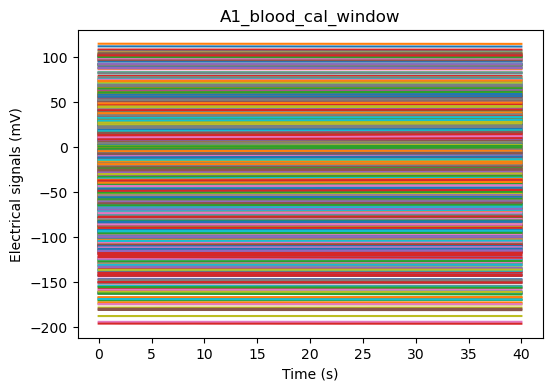

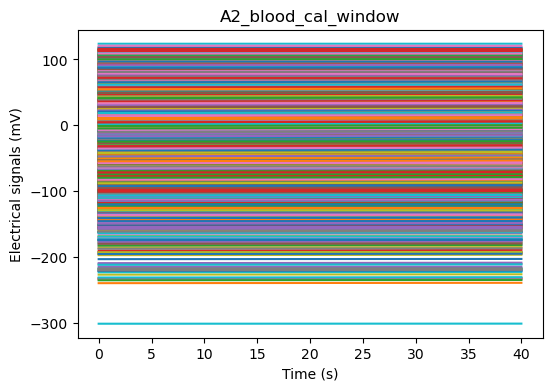

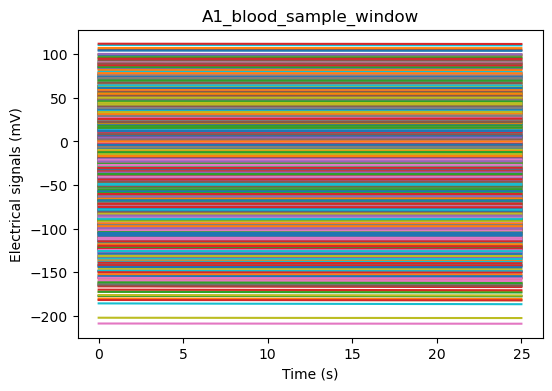

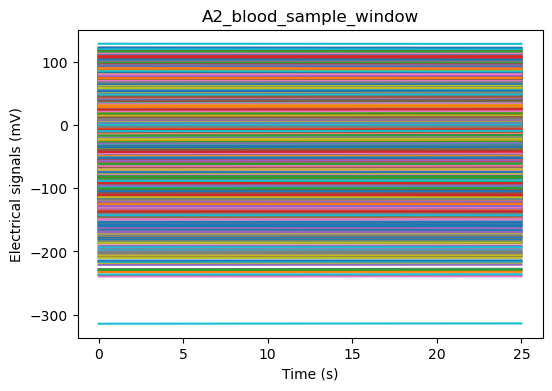

In [14]:
# Plot all the time series from the window extraction
plot_all_time_series(A1_blood_cal_window, "A1_blood_cal_window")
plot_all_time_series(A2_blood_cal_window, "A2_blood_cal_window")
plot_all_time_series(A1_blood_sample_window, "A1_blood_sample_window")
plot_all_time_series(A2_blood_sample_window, "A2_blood_sample_window")

### System 1 and System 2: Sensor A - Aqueous - Cal and Sample Windows

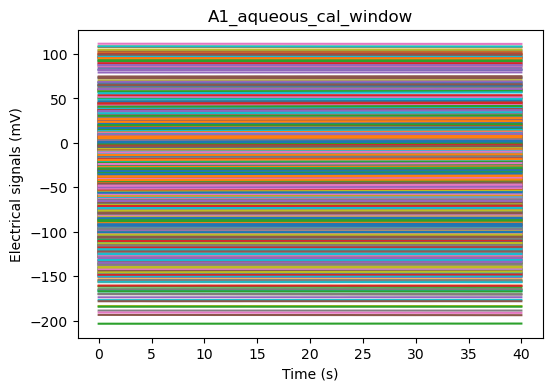

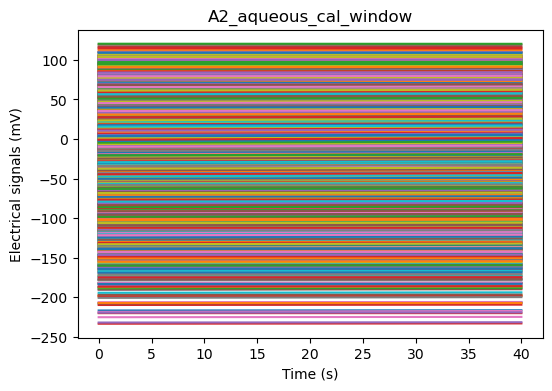

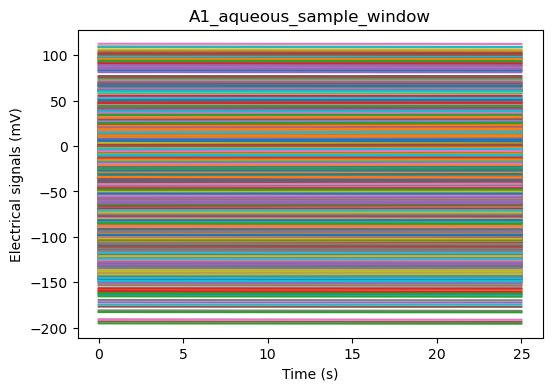

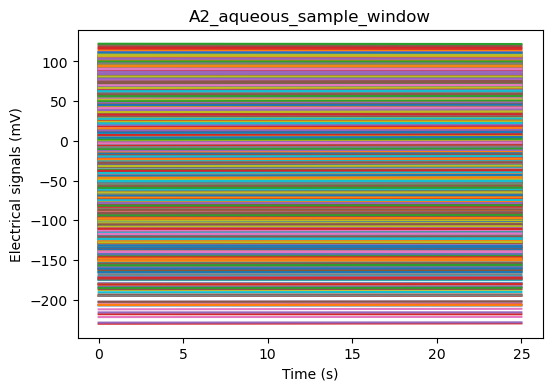

In [15]:
# Plot all the time series from the window extraction
plot_all_time_series(A1_aquous_cal_window, "A1_aqueous_cal_window")
plot_all_time_series(A2_aquous_cal_window, "A2_aqueous_cal_window")
plot_all_time_series(A1_aquous_sample_window, "A1_aqueous_sample_window")
plot_all_time_series(A2_aquous_sample_window, "A2_aqueous_sample_window")

### System 1 and System 2: Sensor B - Blood - Cal and Sample Windows

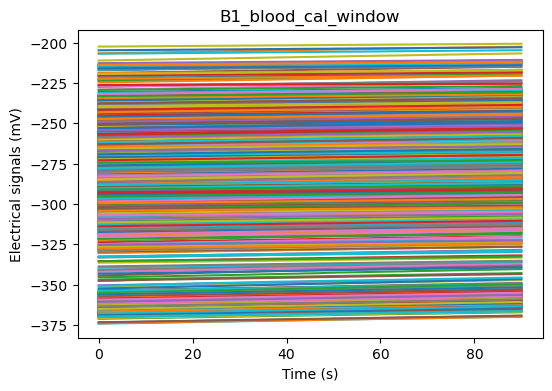

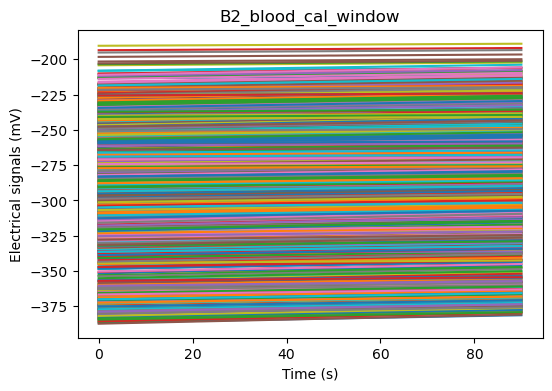

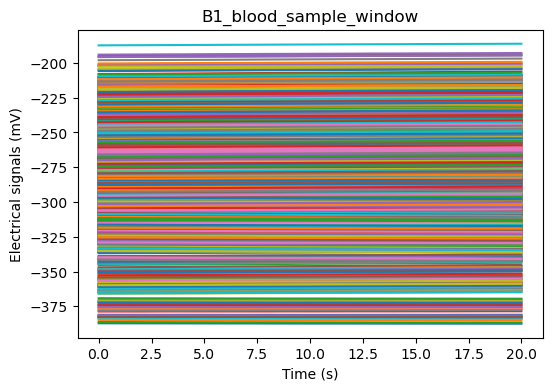

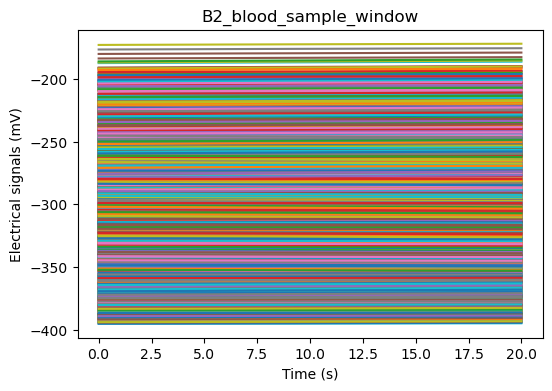

In [16]:
# Plot all the time series from the window extraction
plot_all_time_series(B1_blood_cal_window, "B1_blood_cal_window")
plot_all_time_series(B2_blood_cal_window, "B2_blood_cal_window")
plot_all_time_series(B1_blood_sample_window, "B1_blood_sample_window")
plot_all_time_series(B2_blood_sample_window, "B2_blood_sample_window")

### System 1 and System 2: Sensor B - Aqueous - Cal and Sample Windows

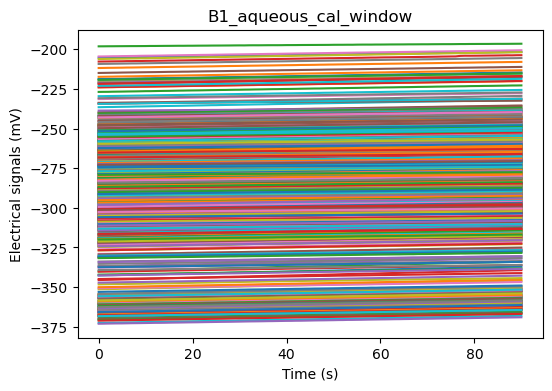

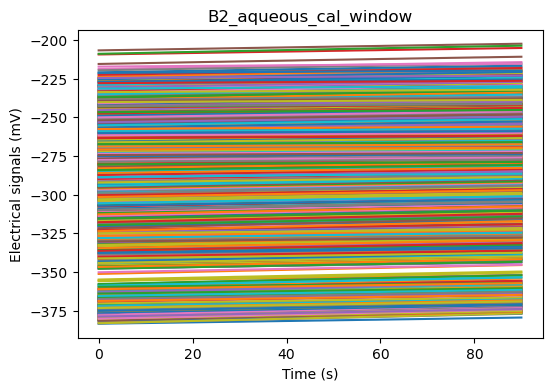

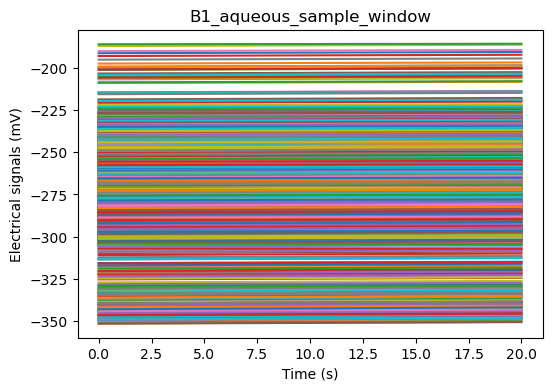

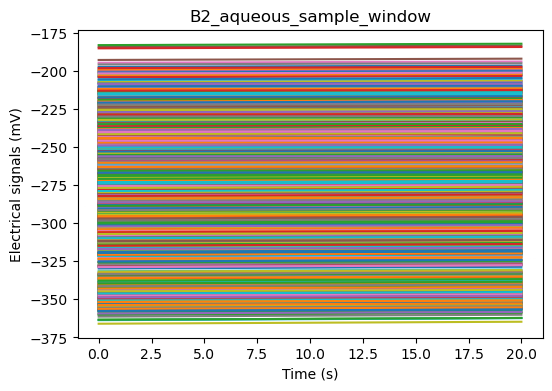

In [17]:
# Plot all the time series from the window extraction
plot_all_time_series(B1_aquous_cal_window, "B1_aqueous_cal_window")
plot_all_time_series(B2_aquous_cal_window, "B2_aqueous_cal_window")
plot_all_time_series(B1_aquous_sample_window, "B1_aqueous_sample_window")
plot_all_time_series(B2_aquous_sample_window, "B2_aqueous_sample_window")

## 11. Functional Principal Components

In [18]:
def perform_functional_pca(data_matrix, y_axis_min=None, y_axis_max=None):
    # Convert the data matrix to an FDataGrid object
    fd = FDataGrid(data_matrix=data_matrix, grid_points=data_matrix.columns.astype(float))

    # Apply Functional PCA
    fpca = FPCA(n_components=2)
    fpca.fit(fd)
    pc_scores = fpca.transform(fd)

    # Explain variance ratio
    print('Explain variance PC1 (%): ', fpca.explained_variance_ratio_[0] * 100)
    print('Explain variance PC2 (%): ', fpca.explained_variance_ratio_[1] * 100)

    # --- Loadings ---
    # Extract the principal components (loadings)
    principal_components = fpca.components_

    # --- Scores ---
    # Print the scores to see contributions of each time series to each principal component
    pc_scores_df = pd.DataFrame(pc_scores, columns=['PC1_Scores', 'PC2_Scores'],
                                index=[data_matrix.index[i] for i in range(data_matrix.shape[0])])
    print("PC Scores:\n", pc_scores_df)

    # Identify which time series (functional data object) contributes the most to each principal component
    max_contribution_index_pc1 = np.argmax(np.abs(pc_scores[:, 0]))  # Index of the maximum absolute score in the first PC
    max_contribution_index_pc2 = np.argmax(np.abs(pc_scores[:, 1]))  # Index of the maximum absolute score in the second PC

    print(f'The time series contributing most to PC1 is at index {max_contribution_index_pc1} with TestID {data_matrix.index[max_contribution_index_pc1]}')
    print(f'The time series contributing most to PC2 is at index {max_contribution_index_pc2} with TestID {data_matrix.index[max_contribution_index_pc2]}')
    
    # --- Plotting Principal Components ---
    fig, axs = plt.subplots(1, 3, figsize=(12, 3))

    # Both Functional PC's
    axs[0].plot(fpca.components_[0].grid_points[0], fpca.components_[0].data_matrix[0].flatten(), marker='o', linestyle='-', label='Component 1')
    axs[0].plot(fpca.components_[1].grid_points[0], fpca.components_[1].data_matrix[0].flatten(), marker='o', linestyle='-', label='Component 2')
    axs[0].set_title("Functional Principal Components")
    axs[0].set_xlabel('Time')
    axs[0].set_ylabel('Functional PC Values')
    axs[0].legend()
    axs[0].grid(True)
    axs[0].set_ylim(y_axis_min, y_axis_max)

    # FPC1
    axs[1].plot(fpca.components_[0].grid_points[0], fpca.components_[0].data_matrix[0].flatten(), marker='o', linestyle='-', label='Component 1')
    axs[1].set_title("Component 1")
    axs[1].set_title("Functional Component 1")
    axs[1].set_xlabel('Time')
    axs[1].set_ylabel('')
    axs[1].legend()
    axs[1].grid(True)
    axs[1].set_ylim(y_axis_min, y_axis_max)

    # FPC2
    axs[2].plot(fpca.components_[1].grid_points[0], fpca.components_[1].data_matrix[0].flatten(), marker='o', linestyle='-', label='Component 2', color='darkorange')
    axs[2].set_title("Component 2")
    axs[2].set_title("Functional Component 2")
    axs[2].set_xlabel('Time')
    axs[2].set_ylabel('')
    axs[2].legend()
    axs[2].grid(True)
    axs[2].set_ylim(y_axis_min, y_axis_max)

    # Adjust layout
    plt.tight_layout()

    # Show the plot
    plt.show()

# ------------------------------------------------------ Sensor A ----------------------------------------------------------

# Cal Window

## Cal Window: System 1/2 - Blood

Explain variance PC1 (%):  99.99898050746998
Explain variance PC2 (%):  0.001015889851533376
PC Scores:
           PC1_Scores  PC2_Scores
12414200 -466.060746    0.785260
12414201 -386.010834    0.167402
12414202 -482.087113    0.666505
12414203 -467.106836    0.604938
12414204 -523.251195    0.753668
...              ...         ...
12624891  -77.039267   -0.373435
12624893 -110.343970   -0.341533
12537663 -162.280840   -1.623983
12572832  526.111217    1.054466
12572836  -58.649659   -0.266792

[1916 rows x 2 columns]
The time series contributing most to PC1 is at index 1803 with TestID 12572826
The time series contributing most to PC2 is at index 1882 with TestID 12599845


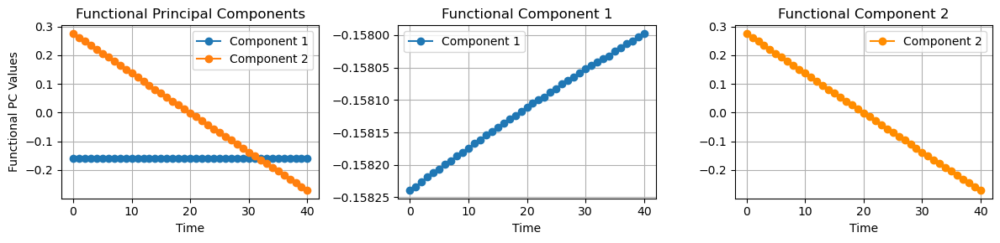

Explain variance PC1 (%):  99.99891324250744
Explain variance PC2 (%):  0.0010852452966890434
PC Scores:
          PC1_Scores  PC2_Scores
3550995 -208.597245   -1.068516
3551012 -132.862194   -1.174030
3551031 -291.233701   -1.601344
3551047 -214.027219   -1.044957
3551065 -198.786004   -1.208934
...             ...         ...
3518459 -422.986546   -0.589278
3518460 -448.803156   -1.729648
3518431  -95.234287   -1.572003
3518461   -5.118450   -1.244237
3518462  163.931217   -1.820001

[4724 rows x 2 columns]
The time series contributing most to PC1 is at index 3619 with TestID 3556087
The time series contributing most to PC2 is at index 3069 with TestID 3561214


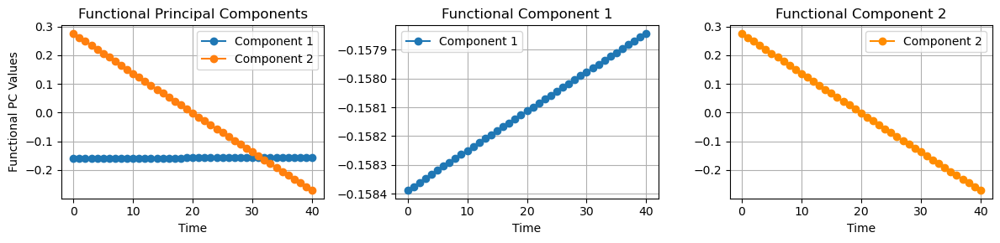

In [19]:
perform_functional_pca(A1_blood_cal_window)
perform_functional_pca(A2_blood_cal_window)
#perform_functional_pca(A1_blood_cal_window, y_axis_min=-0.6, y_axis_max=0.6)
#perform_functional_pca(A2_blood_cal_window, y_axis_min=-0.6, y_axis_max=0.6)

## Cal Window: System 1/2 - Aquous

Explain variance PC1 (%):  99.99903631073364
Explain variance PC2 (%):  0.0009600297561910741
PC Scores:
           PC1_Scores  PC2_Scores
12414372 -629.834138    1.125510
12414373 -595.400743    1.159224
12414374 -621.052115    1.234430
12414375 -596.268795    1.117465
12414377 -647.688876    1.506192
...              ...         ...
12470355  438.399068    1.051695
12470361  543.245842    0.948795
12470365  -16.820129   -0.712827
12539049  -95.990977   -0.456802
12622570  842.798898    1.376544

[1433 rows x 2 columns]
The time series contributing most to PC1 is at index 1042 with TestID 12573667
The time series contributing most to PC2 is at index 828 with TestID 12598120


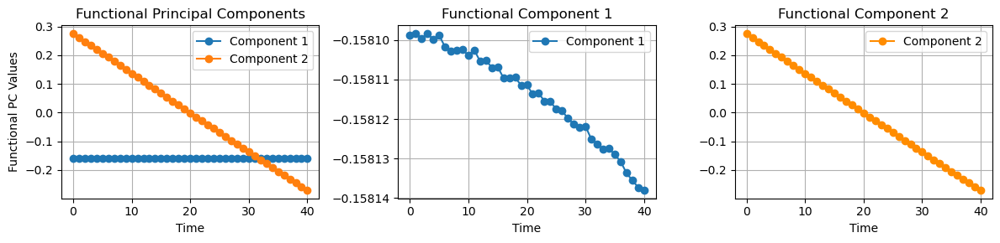

Explain variance PC1 (%):  99.99906167648669
Explain variance PC2 (%):  0.0009370164270387097
PC Scores:
          PC1_Scores  PC2_Scores
3545083 -665.977111   -0.623435
3545084 -619.005020   -0.677462
3545085 -508.275839   -0.958243
3545086 -578.971979   -0.604525
3545087 -537.851578   -0.625387
...             ...         ...
3518708 -522.267253    0.690908
3518710  -14.594300    2.107727
3518621  128.581721    1.181280
3518680 -465.737029    1.369587
3518682 -135.832431    1.677817

[2811 rows x 2 columns]
The time series contributing most to PC1 is at index 2133 with TestID 3572300
The time series contributing most to PC2 is at index 2424 with TestID 3567819


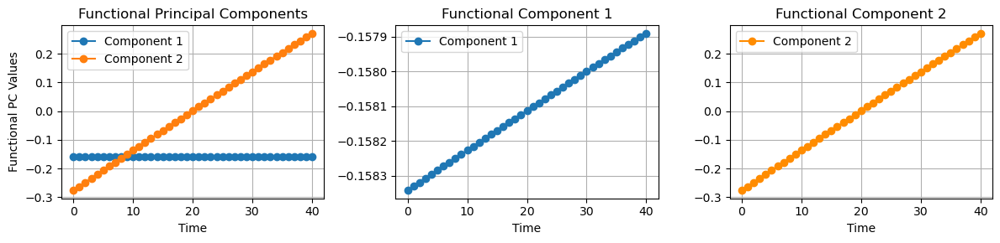

In [20]:
perform_functional_pca(A1_aquous_cal_window)
perform_functional_pca(A2_aquous_cal_window)

# Sample Window

## Sample Window: System 1/2 - Blood

Explain variance PC1 (%):  99.99973879651193
Explain variance PC2 (%):  0.00025736521520852983
PC Scores:
           PC1_Scores  PC2_Scores
12414200 -334.872237    0.202924
12414201 -276.165581   -0.082996
12414202 -348.752658    0.188245
12414203 -337.065073    0.153035
12414204 -380.583875    0.181058
...              ...         ...
12624891   -1.556494   -0.139803
12624893  -23.708409   -0.176332
12537663 -214.867875   -0.469177
12572832  340.779399    0.224741
12572836 -126.458295    0.102622

[1916 rows x 2 columns]
The time series contributing most to PC1 is at index 1706 with TestID 12574513
The time series contributing most to PC2 is at index 462 with TestID 12191350


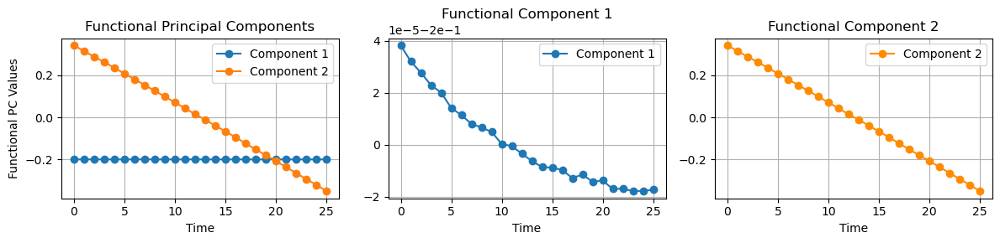

Explain variance PC1 (%):  99.99965469619087
Explain variance PC2 (%):  0.00034339799043378604
PC Scores:
          PC1_Scores  PC2_Scores
3550995 -210.057056   -0.414404
3551012 -151.452480   -0.446531
3551031 -279.799777   -0.687879
3551047 -214.426837   -0.434412
3551065 -203.858350   -0.501210
...             ...         ...
3518459 -276.049707   -0.098992
3518460 -305.039845   -0.591231
3518431 -180.014023   -0.678460
3518461   48.108279   -0.470432
3518462  176.534198   -0.400713

[4724 rows x 2 columns]
The time series contributing most to PC1 is at index 3619 with TestID 3556087
The time series contributing most to PC2 is at index 3069 with TestID 3561214


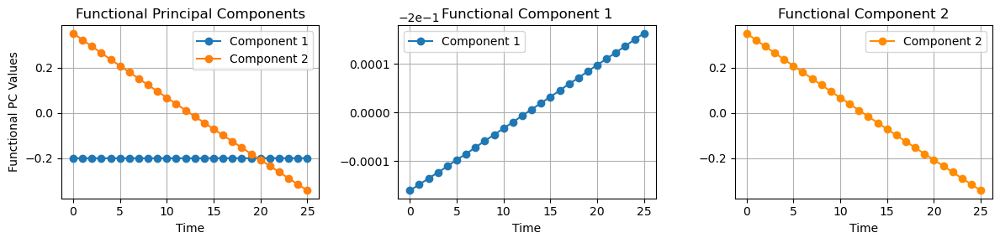

In [21]:
perform_functional_pca(A1_blood_sample_window)
perform_functional_pca(A2_blood_sample_window)

## Sample Window: System 1/2 - Aqueous

Explain variance PC1 (%):  99.99968073771691
Explain variance PC2 (%):  0.0003159921089964713
PC Scores:
           PC1_Scores  PC2_Scores
12414372 -489.991060   -0.487655
12414373 -462.556423   -0.512182
12414374 -482.558618   -0.494353
12414375 -463.166186   -0.505013
12414377 -501.402449   -0.648148
...              ...         ...
12470355  354.788097   -0.472507
12470361  436.176632   -0.382653
12470365  -20.093376    0.305902
12539049  -80.128410    0.205203
12622570  673.848396   -0.589146

[1433 rows x 2 columns]
The time series contributing most to PC1 is at index 1042 with TestID 12573667
The time series contributing most to PC2 is at index 191 with TestID 12615995


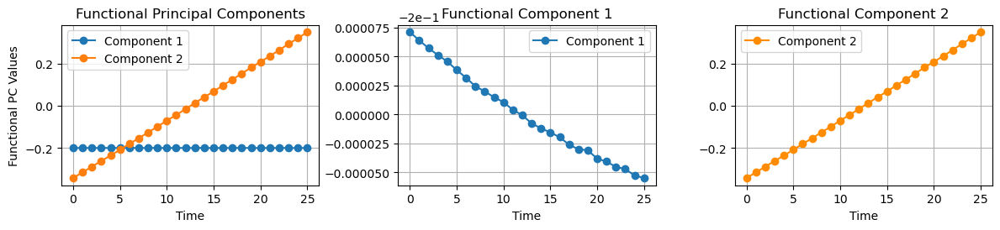

Explain variance PC1 (%):  99.99967265156322
Explain variance PC2 (%):  0.0003265797076880109
PC Scores:
          PC1_Scores  PC2_Scores
3545083 -515.251009    0.397134
3545084 -478.296981    0.378717
3545085 -389.177221    0.536078
3545086 -447.029801    0.371955
3545087 -414.501506    0.421247
...             ...         ...
3518708 -414.118321   -0.298581
3518710  -24.859987   -0.723613
3518621   94.209622   -0.498086
3518680 -376.593000   -0.743001
3518682 -116.768966   -0.775585

[2811 rows x 2 columns]
The time series contributing most to PC1 is at index 2133 with TestID 3572300
The time series contributing most to PC2 is at index 1063 with TestID 3569143


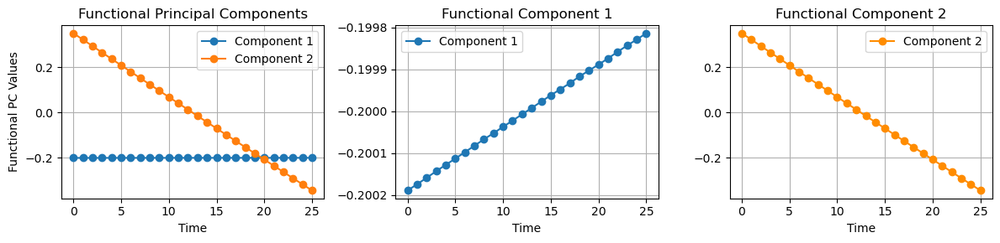

In [22]:
perform_functional_pca(A1_aquous_sample_window)
perform_functional_pca(A2_aquous_sample_window)

# ------------------------------------------------------ Sensor B ----------------------------------------------------------

## Cal Window:  System 1/2 - Blood

Explain variance PC1 (%):  99.99429965213402
Explain variance PC2 (%):  0.005674922119799839
PC Scores:
           PC1_Scores  PC2_Scores
12414200 -280.735614    3.616149
12414201 -273.224911    3.950660
12414202 -290.152444    3.608065
12414203 -307.783676    3.319943
12414204 -354.889295    3.775659
...              ...         ...
12537664 -246.348852    2.054196
12537668 -172.027863    0.162744
12624891  119.129034   -2.287491
12624893   39.841893   -2.576547
12537663 -137.189694    0.334835

[1944 rows x 2 columns]
The time series contributing most to PC1 is at index 219 with TestID 12544066
The time series contributing most to PC2 is at index 1681 with TestID 12395731


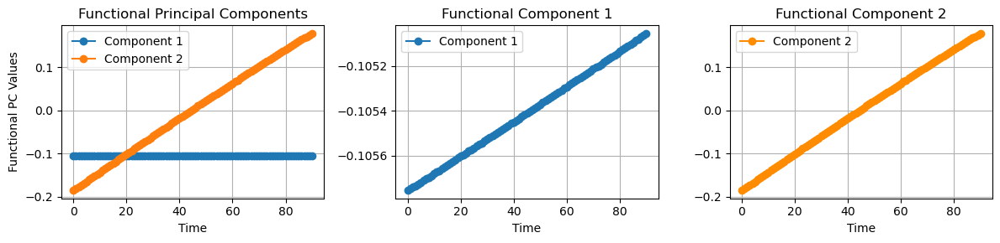

Explain variance PC1 (%):  99.99541540509125
Explain variance PC2 (%):  0.004567289166225335
PC Scores:
          PC1_Scores  PC2_Scores
3550995  107.739368    0.463722
3551012   10.189149   -0.872549
3551031  315.567684   -0.174101
3551047  189.279095    1.082127
3551065  104.327362    0.521352
...             ...         ...
3518442  585.567207   -5.789235
3518443  331.635655   -6.783318
3518444  422.866251   -6.959739
3518445  254.501070   -6.843832
3518456  634.603988   -5.829742

[4893 rows x 2 columns]
The time series contributing most to PC1 is at index 418 with TestID 3556268
The time series contributing most to PC2 is at index 2526 with TestID 3567091


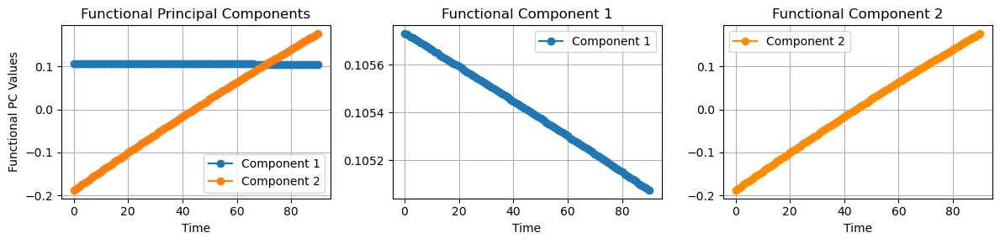

In [23]:
perform_functional_pca(B1_blood_cal_window)
perform_functional_pca(B2_blood_cal_window)

## Cal Window:  System 1/2 - Aqueous

Explain variance PC1 (%):  99.99402628874086
Explain variance PC2 (%):  0.005943245121920697
PC Scores:
           PC1_Scores  PC2_Scores
12414372  370.691377    2.814008
12414373  373.625801    2.822501
12414374  407.810233    3.268249
12414375  405.188164    3.143201
12414377  365.695460    2.549781
...              ...         ...
12470355 -117.699988   -3.399520
12470361   60.284807   -1.418356
12470365  125.647578   -0.829341
12539049  129.244533   -1.050934
12622570   -7.563354   -1.747086

[1431 rows x 2 columns]
The time series contributing most to PC1 is at index 472 with TestID 12437598
The time series contributing most to PC2 is at index 203 with TestID 12615993


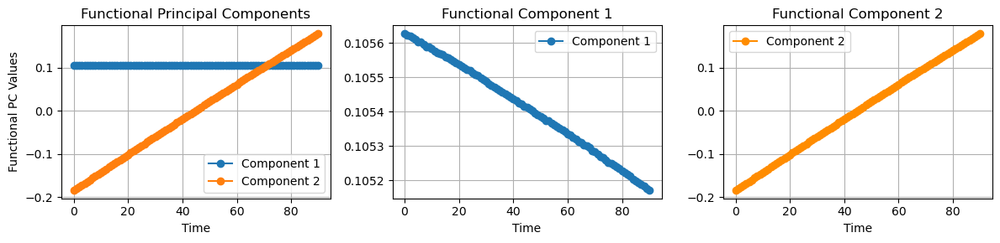

Explain variance PC1 (%):  99.99374509609666
Explain variance PC2 (%):  0.0062358258696626175
PC Scores:
          PC1_Scores  PC2_Scores
3545083  542.405894    3.544643
3545084  531.495469    3.188401
3545085  458.332247    2.269276
3545086  544.628557    3.788931
3545087  455.449713    3.318268
...             ...         ...
3518583  578.831070   -6.471654
3518675  603.310206   -6.095167
3518676  425.468952   -5.943599
3518677  412.730241   -7.148036
3518678  311.542760   -7.127060

[2852 rows x 2 columns]
The time series contributing most to PC1 is at index 195 with TestID 3548448
The time series contributing most to PC2 is at index 2426 with TestID 3567819


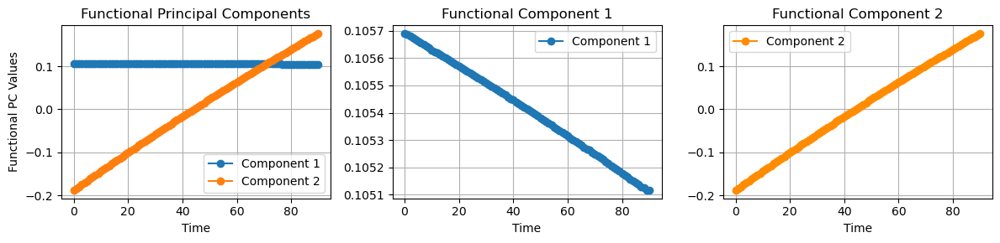

In [24]:
perform_functional_pca(B1_aquous_cal_window)
perform_functional_pca(B2_aquous_cal_window)

## Sample Window:  System 1/2 - Blood

Explain variance PC1 (%):  99.9962010080934
Explain variance PC2 (%):  0.003789663009253871
PC Scores:
           PC1_Scores  PC2_Scores
12414200 -112.216634   -0.147633
12414201 -110.629548   -0.018918
12414202 -115.538024   -0.060158
12414203 -122.847068    0.032328
12414204 -147.902498   -0.031222
...              ...         ...
12537664 -227.197382   -0.078896
12537668 -188.232317   -0.205236
12624891  187.188919    1.235715
12624893  163.116044    1.789061
12537663 -173.113581   -0.214604

[1944 rows x 2 columns]
The time series contributing most to PC1 is at index 240 with TestID 12546591
The time series contributing most to PC2 is at index 452 with TestID 12191207


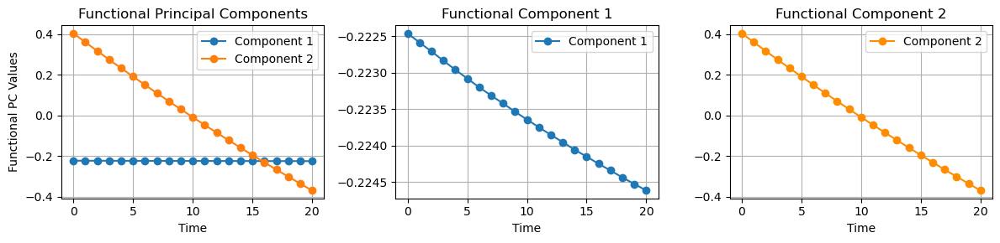

Explain variance PC1 (%):  99.99794532419344
Explain variance PC2 (%):  0.0020505592070548906
PC Scores:
          PC1_Scores  PC2_Scores
3550995  125.469271   -0.522653
3551012   75.409797   -0.458847
3551031  216.979992   -0.288089
3551047  162.389073   -0.421400
3551065  123.388533   -0.467927
...             ...         ...
3518442  128.978857    2.973429
3518443    8.285297    2.764683
3518444   51.254308    2.837675
3518445  -31.406804    3.156691
3518456  151.983057    2.868753

[4893 rows x 2 columns]
The time series contributing most to PC1 is at index 418 with TestID 3556268
The time series contributing most to PC2 is at index 4868 with TestID 3518458


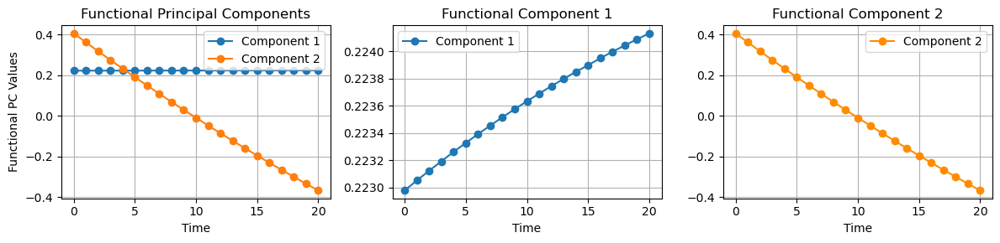

In [25]:
perform_functional_pca(B1_blood_sample_window)
perform_functional_pca(B2_blood_sample_window)

## Sample Window:  System 1/2 - Aqueous

Explain variance PC1 (%):  99.99969297598619
Explain variance PC2 (%):  0.0002958998694525811
PC Scores:
           PC1_Scores  PC2_Scores
12414372  182.961892   -0.373822
12414373  182.249332   -0.359877
12414374  200.003408   -0.373952
12414375  198.678505   -0.351537
12414377  177.869578   -0.310900
...              ...         ...
12470355  -70.960339    0.351319
12470361   17.593421    0.140385
12470365   47.188853    0.185141
12539049   45.405345    0.078044
12622570  -25.167515    0.127562

[1431 rows x 2 columns]
The time series contributing most to PC1 is at index 472 with TestID 12437598
The time series contributing most to PC2 is at index 1044 with TestID 12623840


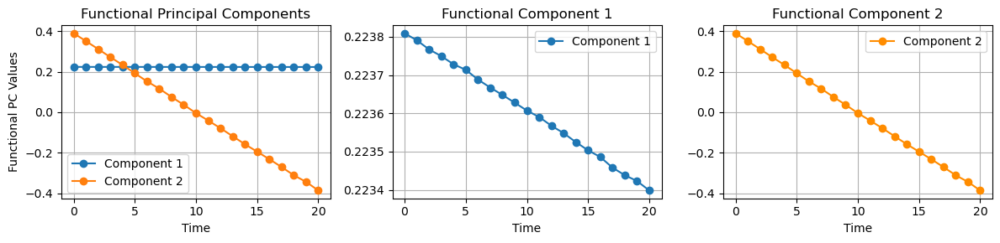

Explain variance PC1 (%):  99.99976387185511
Explain variance PC2 (%):  0.00023388079063263733
PC Scores:
          PC1_Scores  PC2_Scores
3545083  262.090591   -0.305224
3545084  255.026071   -0.312076
3545085  217.728533   -0.154386
3545086  261.449605   -0.297389
3545087  220.446807   -0.279763
...             ...         ...
3518583  244.638959    0.482587
3518675  234.850414    0.495165
3518676  153.581131    0.528870
3518677  141.872451    0.683167
3518678   96.559830    0.676792

[2852 rows x 2 columns]
The time series contributing most to PC1 is at index 212 with TestID 3548492
The time series contributing most to PC2 is at index 2823 with TestID 3518631


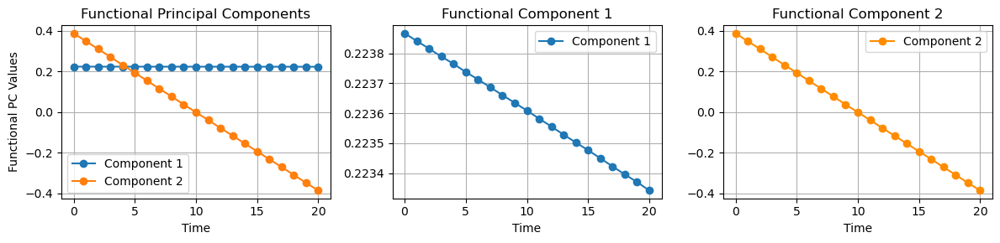

In [26]:
perform_functional_pca(B1_aquous_sample_window)
perform_functional_pca(B2_aquous_sample_window)

# Sample Window

## 11.1. Functional PCA characterization function

In [27]:
def perform_fpca_and_plot(time_series_s1, time_series_s2, features_s1, features_s2, y_axis_min=None, y_axis_max=None):
    # Convert the data matrix to an FDataGrid object
    fd_s1 = FDataGrid(data_matrix=time_series_s1, grid_points=time_series_s1.columns.astype(float)) # System 1
    fd_s2 = FDataGrid(data_matrix=time_series_s2, grid_points=time_series_s2.columns.astype(float)) # System 2

    # Apply Functional PCA for System 1
    fpca_s1 = FPCA(n_components=2)
    fpca_s1.fit(fd_s1)
    fpc_and_scores_s1 = fpca_s1.transform(fd_s1)
    
    # Apply Functional PCA for System 2
    fpca_s2 = FPCA(n_components=2)
    fpca_s2.fit(fd_s2)
    fpc_and_scores_s2 = fpca_s2.transform(fd_s2)

    # --- Explain variance ratio ---
    # System 1
    print('S1 Explain variance PC1 (%): ', fpca_s1.explained_variance_ratio_[0] * 100)
    #print('S1 Explain variance PC2 (%): ', fpca_s1.explained_variance_ratio_[1] * 100)
    # System 2
    print('S2 Explain variance PC1 (%): ', fpca_s2.explained_variance_ratio_[0] * 100)
    #print('S2 Explain variance PC2 (%): ', fpca_s2.explained_variance_ratio_[1] * 100)

    # --- Loadings ---
    # Extract the principal components (loadings)
    principal_components_s1 = fpca_s1.components_ # System 1
    principal_components_s2 = fpca_s2.components_ # System 2

    # --- Scores ---
    # Print the scores to see contributions of each time series to each principal component

    # System 1
    pc_scores_s1 = pd.DataFrame(fpc_and_scores_s1, columns=['PC1_Scores', 'PC2_Scores'],
                                index=[time_series_s1.index[i] for i in range(time_series_s1.shape[0])])
    # System 2
    pc_scores_s2 = pd.DataFrame(fpc_and_scores_s2, columns=['PC1_Scores', 'PC2_Scores'],
                                index=[time_series_s2.index[i] for i in range(time_series_s2.shape[0])])

    # --- Plotting First Principal Component for both Systems ---
    # Extracting data for System 1
    x1 = fpca_s1.components_[0].grid_points[0] 
    y1 = fpca_s1.components_[0].data_matrix[0].flatten()

    # Extracting data for System 2
    x2 = fpca_s2.components_[0].grid_points[0] 
    y2 = fpca_s2.components_[0].data_matrix[0].flatten()

    # Plotting both curves in the same graph
    fig = plt.figure(figsize=(5, 3))
    plt.plot(x1, y1, marker='o', linestyle='-', label='Component 1 - S1')
    plt.plot(x2, y2, marker='o', linestyle='-', label='Component 1 - S2')

    plt.legend()
    plt.grid(True)
    plt.xlabel('Time')
    plt.ylabel('Functional PC 1 Values')
    plt.title('System 1 versus System 2')
    plt.ylim(y_axis_min, y_axis_max)
    #plt.ylim((min(y1.min(), y2.min())-0.001), (min(y1.max(), y2.max())+0.001))

    # Show the plot
    plt.show()

    # --- Scores combined with Additional Features ---

    # Reset the index, making the index a column in the DataFrame
    pc_scores_s1_reset = pc_scores_s1.reset_index()
    pc_scores_s2_reset = pc_scores_s2.reset_index()
    pc_scores_s1_reset.rename(columns={'index': 'TestID'}, inplace=True)
    pc_scores_s2_reset.rename(columns={'index': 'TestID'}, inplace=True)

    # Merging functional pc scores and additional features by TestID
    system1_scores_merged = pd.merge(pc_scores_s1_reset, features_s1, how='inner', on=['TestID'])
    system2_scores_merged = pd.merge(pc_scores_s2_reset, features_s2, how='inner', on=['TestID'])

    # --- Characterization of the Functional PC Scores ---

    # Select Features
    selected_columns = ['TestID', 'PC1_Scores','PC2_Scores','FluidType','AgeOfCardInDaysAtTimeOfTest', 'AmbientTemperature']
    data_s1 = system1_scores_merged[selected_columns].copy()
    data_s2 = system2_scores_merged[selected_columns].copy()

    # Binning continuous predictors into discrete intervals
    data_s1.loc[:, 'AgeBin'] = pd.cut(data_s1['AgeOfCardInDaysAtTimeOfTest'], bins=[0, 9, 50, 100, 500], labels=['<=9', '10-50', '51-100', '>100'])
    data_s1.loc[:, 'AmbientTempBin'] = pd.cut(data_s1['AmbientTemperature'],  bins=[-1, 20, 25, 100], labels=['Below 20', '20-25', 'Above 25'])

    data_s2.loc[:, 'AgeBin'] = pd.cut(data_s2['AgeOfCardInDaysAtTimeOfTest'], bins=[0, 9, 50, 100, 500], labels=['<=9', '10-50', '51-100', '>100'])
    data_s2.loc[:, 'AmbientTempBin'] = pd.cut(data_s2['AmbientTemperature'],  bins=[-1, 20, 25, 100], labels=['Below 20', '20-25', 'Above 25'])

    # --- Visualizations ---
    scatter_age_s1 = alt.Chart(data_s1).mark_point().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1"),
        alt.Y('PC2_Scores').axis(title="FPC Score 2"),
        color=alt.Color('AgeBin', scale=alt.Scale(scheme='tableau10'), title="Days"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AgeOfCardInDaysAtTimeOfTest', title="Card Age")]
    ).properties(
        title='FPC Scores by Card Age',
        width=280,
        height=280
    )

    scatter_temp_s1 = alt.Chart(data_s1).mark_point().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1"),
        alt.Y('PC2_Scores').axis(title="FPC Score 2"),
        color=alt.Color('AmbientTempBin', scale=alt.Scale(scheme='tableau10'), title="°C"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AmbientTemperature', title="Ambient Temperature")]
    ).properties(
        title='FPC Scores by Ambient Temperature',
        width=280,
        height=280
    )

    scatter_fluid_s1 = alt.Chart(data_s1).mark_point().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1"),
        alt.Y('PC2_Scores').axis(title="FPC Score 2"),
        color=alt.Color('FluidType', scale=alt.Scale(scheme='tableau10'), title="Fluid"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('FluidType', title="Fluid Type")]
    ).properties(
        title='FPC Scores by Fluid Type',
        width=280,
        height=280
    )

    scatter_age_s2 = alt.Chart(data_s2).mark_point().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1"),
        alt.Y('PC2_Scores').axis(title="FPC Score 2"),
        color=alt.Color('AgeBin', scale=alt.Scale(scheme='tableau10'), title="Days"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AgeOfCardInDaysAtTimeOfTest', title="Card Age")]
    ).properties(
        title='FPC Scores by Card Age',
        width=280,
        height=280
    )

    scatter_temp_s2 = alt.Chart(data_s2).mark_point().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1"),
        alt.Y('PC2_Scores').axis(title="FPC Score 2"),
        color=alt.Color('AmbientTempBin', scale=alt.Scale(scheme='tableau10'), title="°C"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AmbientTemperature', title="Ambient Temperature")]
    ).properties(
        title='FPC Scores by Ambient Temperature',
        width=280,
        height=280
    )

    scatter_fluid_s2 = alt.Chart(data_s2).mark_point().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1"),
        alt.Y('PC2_Scores').axis(title="FPC Score 2"),
        color=alt.Color('FluidType', scale=alt.Scale(scheme='tableau10'), title="Fluid"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('FluidType', title="Fluid Type")]
    ).properties(
        title='FPC Scores by Fluid Type',
        width=280,
        height=280
    )

    # --- Display the plots ---
    # System 1 plots
    s1_plots = alt.hconcat(
        scatter_fluid_s1, scatter_age_s1, scatter_temp_s1
    ).resolve_scale(
        color='independent'
    ).properties(
        title='System 1'
    )

    # System 2 plots
    s2_plots = alt.hconcat(
        scatter_fluid_s2, scatter_age_s2, scatter_temp_s2
    ).resolve_scale(
        color='independent'
    ).properties(
        title='System 2'
    )

    # Concatenating plots in same grid
    plots_vconcatenated = alt.vconcat(
        s1_plots,
        s2_plots
    ).configure_view(
        stroke=None
    )

    return plots_vconcatenated

# 11.1.1. Functional PC1 and Characterization of FPC Scores

# ------------------------------------------------------ Sensor A ----------------------------------------------------------

# Cal Window

### 1) System 1 versus System 2: Sensor A - Blood - Cal Window

S1 Explain variance PC1 (%):  99.99898050746998
S2 Explain variance PC1 (%):  99.99891324250748


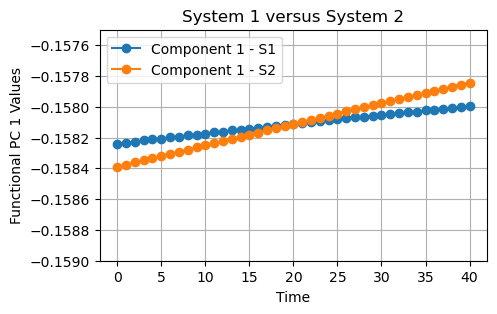

alt.VConcatChart(...)

In [28]:
perform_fpca_and_plot(A1_blood_cal_window, A2_blood_cal_window, A1_Merged, A2_Merged, y_axis_min = -0.1590, y_axis_max = -0.1575)

### 2) System 1 versus System 2: Sensor A - Aqueous - Cal Window

S1 Explain variance PC1 (%):  99.99903631073364
S2 Explain variance PC1 (%):  99.99906167648676


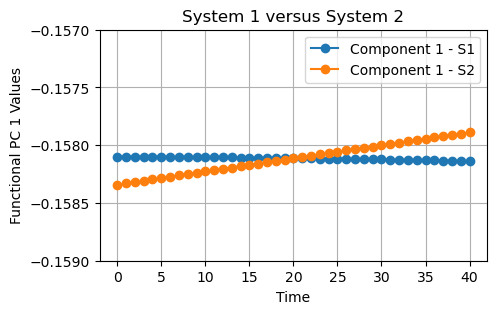

alt.VConcatChart(...)

In [29]:
perform_fpca_and_plot(A1_aquous_cal_window, A2_aquous_cal_window, A1_Merged, A2_Merged, y_axis_min = -0.1590, y_axis_max = -0.1570)

# Sample Window
### 1) System 1 versus System 2: Sensor A - Blood - Sample Window

S1 Explain variance PC1 (%):  99.99973879651188
S2 Explain variance PC1 (%):  99.99965469619087


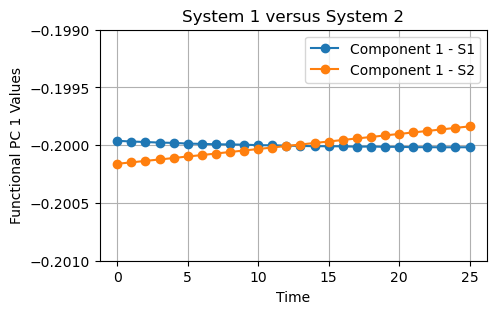

alt.VConcatChart(...)

In [30]:
# 0.20025 - 0.19975
perform_fpca_and_plot(A1_blood_sample_window, A2_blood_sample_window, A1_Merged, A2_Merged, y_axis_min = -0.2010, y_axis_max = -0.1990)

### 2) System 1 versus System 2: Sensor A - Aqueous - Sample Window

S1 Explain variance PC1 (%):  99.99968073771691
S2 Explain variance PC1 (%):  99.99967265156326


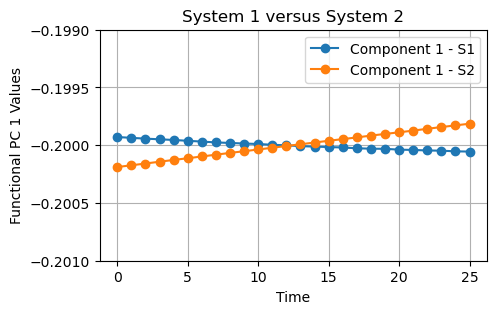

alt.VConcatChart(...)

In [31]:
perform_fpca_and_plot(A1_aquous_sample_window, A2_aquous_sample_window, A1_Merged, A2_Merged, y_axis_min = -0.2010, y_axis_max = -0.1990)

# ------------------------------------------------------ Sensor B ----------------------------------------------------------

# Cal Window

### 1) System 1 versus System 2: Sensor B - Aqueous - Cal Window

S1 Explain variance PC1 (%):  99.99402628874086
S2 Explain variance PC1 (%):  99.99374509609666


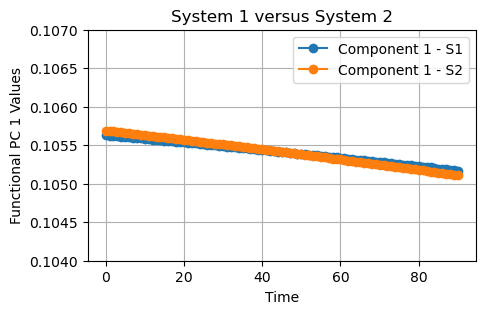

alt.VConcatChart(...)

In [32]:
perform_fpca_and_plot(B1_aquous_cal_window, B2_aquous_cal_window, B1_Merged, B2_Merged, y_axis_min = 0.104, y_axis_max = 0.107)

### 2) System 1 versus System 2: Sensor B - Blood - Cal Window

S1 Explain variance PC1 (%):  99.99429965213402
S2 Explain variance PC1 (%):  99.99541540509124


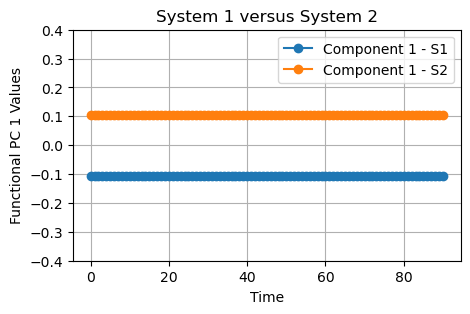

alt.VConcatChart(...)

In [33]:
perform_fpca_and_plot(B1_blood_cal_window, B2_blood_cal_window, B1_Merged, B2_Merged,y_axis_min = -0.4, y_axis_max = 0.4)

# Sample Window

### 1) System 1 versus System 2: Sensor B - Aqueous - Sample Window

S1 Explain variance PC1 (%):  99.99969297598615
S2 Explain variance PC1 (%):  99.99976387185511


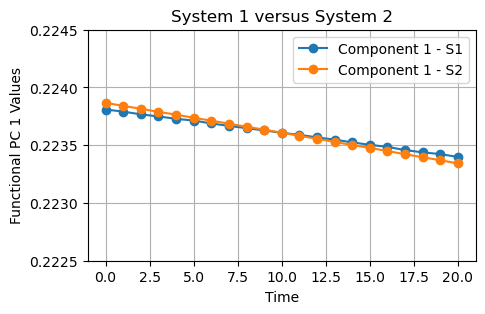

alt.VConcatChart(...)

In [34]:
perform_fpca_and_plot(B1_aquous_sample_window, B2_aquous_sample_window, B1_Merged, B2_Merged, y_axis_min = 0.2225, y_axis_max = 0.2245)

### 2) System 1 versus System 2: Sensor B - Blood - Sample Window

S1 Explain variance PC1 (%):  99.99620100809345
S2 Explain variance PC1 (%):  99.99794532419344


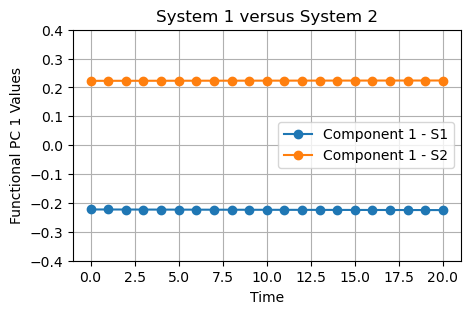

alt.VConcatChart(...)

In [35]:
perform_fpca_and_plot(B1_blood_sample_window, B2_blood_sample_window, B1_Merged, B2_Merged, y_axis_min = -0.4, y_axis_max = 0.4)